In [1]:
using CSV, DataFrames

In [2]:
df = CSV.read("data/Map_of_Registered_Business_Locations.csv", DataFrame)

,Location Id,Business Account Number,Ownership Name,DBA Name
,String,Int64,String,String
1,0474285-05-001,474285,Pressed Juicery Inc,Pressed Juicery
2,0474285-06-001,474285,Pressed Juicery Inc,Pressed Juicery
3,1045798-12-151,1021444,Benhammou Ahmida,Zaalouk Market & Deli Grocery
4,1170655-12-171,1080758,San Francisco Security Services Llc,San Francisco Security Services Llc
5,1172862-12-171,1081156,Teresa. Spalding,Teresa Spalding
6,1172877-12-171,1081158,Three R Properties,Three R Properties
7,1172879-12-171,1081159,"Rhi-Mosser 275 Turk, Lp","Rhi-Mosser 275 Turk, Lp"
8,1173595-12-171,1081185,Weibin Wu,Weibin Wu
9,1173614-12-171,1081187,Ockchain Inc,Ockchain Inc


In [3]:
describe(df)

,variable,mean,min
,Symbol,Union…,Any
1,Location Id,,0000024-02-999
2,Business Account Number,6.23106e5,24
3,Ownership Name,,#10 Sports Llc
4,DBA Name,,#1 Babes
5,Street Address,,#10
6,City,,0
7,State,,AB
8,Source Zipcode,92957.8,0
9,Business Start Date,,01/01/1941


In [4]:
size(df, 1)

222871

In [5]:
df[df[!, Symbol("Parking Tax")] .== true, :][1:10, [Symbol("DBA Name"), Symbol("Parking Tax")]]

,DBA Name,Parking Tax
,String,Bool
1,Test 12/28/2017 Location 1 / Parking,1
2,Douglas Parking,1
3,Douglas Parking,1
4,Douglas Parking,1
5,Volume Parking Services,1
6,Douglas Parking,1
7,Douglas Parking,1
8,Hyde Park Management Llc,1
9,Chestnut Street Lot,1


In [6]:
using Query

In [7]:
@from i in df begin
	@where i[Symbol("Parking Tax")] == true
	@select i
	@collect DataFrame
end

,Location Id,Business Account Number,Ownership Name,DBA Name
,String,Int64,String,String
1,1173734-12-171,1081206,Test 12/28/2017,Test 12/28/2017 Location 1 / Parking
2,0331622-05-001,331622,Douglas Parking Llc,Douglas Parking
3,0331622-07-001,331622,Douglas Parking Llc,Douglas Parking
4,1003077-07-141,331622,Douglas Parking Llc,Douglas Parking
5,1059531-03-161,1009459,Volume Parking Services Inc,Volume Parking Services
6,1099910-08-161,331622,Douglas Parking Llc,Douglas Parking
7,1138241-02-171,331622,Douglas Parking Llc,Douglas Parking
8,1173943-12-171,433156,Hyde Park Management Llc,Hyde Park Management Llc
9,1003009-07-141,329140,Imperial Parking (Us) Llc,Chestnut Street Lot


In [8]:
rename!(df, [n => replace(string(n), " "=>"_") |> Symbol for n in names(df)])

,Location_Id,Business_Account_Number,Ownership_Name,DBA_Name
,String,Int64,String,String
1,0474285-05-001,474285,Pressed Juicery Inc,Pressed Juicery
2,0474285-06-001,474285,Pressed Juicery Inc,Pressed Juicery
3,1045798-12-151,1021444,Benhammou Ahmida,Zaalouk Market & Deli Grocery
4,1170655-12-171,1080758,San Francisco Security Services Llc,San Francisco Security Services Llc
5,1172862-12-171,1081156,Teresa. Spalding,Teresa Spalding
6,1172877-12-171,1081158,Three R Properties,Three R Properties
7,1172879-12-171,1081159,"Rhi-Mosser 275 Turk, Lp","Rhi-Mosser 275 Turk, Lp"
8,1173595-12-171,1081185,Weibin Wu,Weibin Wu
9,1173614-12-171,1081187,Ockchain Inc,Ockchain Inc


In [9]:
@from i in df begin
	@where i.Parking_Tax == true
	@select i
	@collect DataFrame
end

,Location_Id,Business_Account_Number,Ownership_Name,DBA_Name
,String,Int64,String,String
1,1173734-12-171,1081206,Test 12/28/2017,Test 12/28/2017 Location 1 / Parking
2,0331622-05-001,331622,Douglas Parking Llc,Douglas Parking
3,0331622-07-001,331622,Douglas Parking Llc,Douglas Parking
4,1003077-07-141,331622,Douglas Parking Llc,Douglas Parking
5,1059531-03-161,1009459,Volume Parking Services Inc,Volume Parking Services
6,1099910-08-161,331622,Douglas Parking Llc,Douglas Parking
7,1138241-02-171,331622,Douglas Parking Llc,Douglas Parking
8,1173943-12-171,433156,Hyde Park Management Llc,Hyde Park Management Llc
9,1003009-07-141,329140,Imperial Parking (Us) Llc,Chestnut Street Lot


In [10]:
assign = :(x = 2)

:(x = 2)

In [11]:
eval(assign)

2

In [12]:
x

2

In [13]:
fieldnames(typeof(assign))

(:head, :args)

In [14]:
dump(assign)

Expr
  head: Symbol =
  args: Array{Any}((2,))
    1: Symbol x
    2: Int64 2


In [15]:
assign.args[2] = 3

3

In [16]:
eval(assign)

3

In [17]:
x

3

In [18]:
assign4 = Expr(:(=), :x, 4)

:(x = 4)

In [19]:
eval(assign4)

4

In [20]:
x

4

In [21]:
quote
	y = 42
	x = 10
end

quote
    #= In[21]:2 =#
    y = 42
    #= In[21]:3 =#
    x = 10
end

In [22]:
eval(ans)

10

In [23]:
y

42

In [24]:
x

10

In [25]:
name = "Dan"

"Dan"

In [26]:
greet = :("Hello " * $name)

:("Hello " * "Dan")

In [27]:
eval(greet)

"Hello Dan"

In [28]:
macro greet(name)
    :("Hello " * $name)
end

@greet (macro with 1 method)

In [29]:
@greet("Adrian")

"Hello Adrian"

In [30]:
@greet "Julia"

"Hello Julia"

In [31]:
macro twostep(arg)
	println("I execute at parse time. The argument is: ", arg)
	return :(println("I execute at runtime. The argument is: ", $arg))
end

@twostep (macro with 1 method)

In [32]:
ex = macroexpand(@__MODULE__, :(@twostep :(1, 2, 3)));

I execute at parse time. The argument is: :((1, 2, 3))


In [33]:
eval(ex)

I execute at runtime. The argument is: (1, 2, 3)


In [34]:
shopping_list = DataFrame(produce=["Apples", "Milk", "Bread"], qty=[5, 2, 1])

,produce,qty
,String,Int64
1,Apples,5
2,Milk,2
3,Bread,1


In [35]:
@from p in shopping_list begin
    @select p
end

produce,qty
"""Apples""",5
"""Milk""",2
"""Bread""",1


In [36]:
@from p in shopping_list begin
    @select p.produce
end

3-element query result
 "Apples"
 "Milk"
 "Bread"

In [37]:
@from p in shopping_list begin
	@select p.produce
end

3-element query result
 "Apples"
 "Milk"
 "Bread"

In [38]:
@from p in shopping_list begin
	@select uppercase(p.produce), 2p.qty
end

3-element query result
 ("APPLES", 10)
 ("MILK", 4)
 ("BREAD", 2)

In [39]:
@from p in shopping_list begin
    @select { produce = uppercase(p.produce), qty = 2p.qty }
end

produce,qty
"""APPLES""",10
"""MILK""",4
"""BREAD""",2


In [40]:
@from p in shopping_list begin
    @select { PRODUCE = uppercase(p.produce), double_qty = 2p.qty }
    @collect
end

3-element Vector{NamedTuple{(:PRODUCE, :double_qty), Tuple{String, Int64}}}:
 (PRODUCE = "APPLES", double_qty = 10)
 (PRODUCE = "MILK", double_qty = 4)
 (PRODUCE = "BREAD", double_qty = 2)

In [41]:
@from p in shopping_list begin
    @select {PRODUCE = uppercase(p.produce), double_qty = 2p.qty}
    @collect DataFrame
end

,PRODUCE,double_qty
,String,Int64
1,APPLES,10
2,MILK,4
3,BREAD,2


In [42]:
@from p in shopping_list begin
    @where p.qty < 2
    @select p
    @collect DataFrame
end

,produce,qty
,String,Int64
1,Bread,1


In [43]:
@from p in shopping_list begin
    @let weekly_qty = 7p.qty
    @where weekly_qty > 10
    @select { p.produce, week_qty=weekly_qty }
    @collect DataFrame
end

,produce,week_qty
,String,Int64
1,Apples,35
2,Milk,14


In [44]:
products_info = DataFrame(produce = ["Apples", "Milk", "Bread"], price = [2.20, 0.45, 0.79], allergenic = [false, true, true])

,produce,price,allergenic
,String,Float64,Bool
1,Apples,2.2,0
2,Milk,0.45,1
3,Bread,0.79,1


In [45]:
shopping_info = @from p in shopping_list begin
	@join pinfo in products_info on p.produce equals pinfo.produce
	@select { p.produce, p.qty, pinfo.price, pinfo.allergenic }
	@collect DataFrame
end

,produce,qty,price,allergenic
,String,Int64,Float64,Bool
1,Apples,5,2.2,0
2,Milk,2,0.45,1
3,Bread,1,0.79,1


In [46]:
@from p in shopping_info begin
    @group p.produce by p.allergenic
    @collect
end

2-element Vector{Grouping{Bool, String}}:
 ["Apples"]
 ["Milk", "Bread"]

In [47]:
@from p in shopping_info begin
   @group p by p.allergenic into q
   @select { allergenic = key(q), count = length(q.allergenic), produce = join(q.produce, ", ") }
   @collect DataFrame
end

,allergenic,count,produce
,Bool,Int64,String
1,0,1,Apples
2,1,2,"Milk, Bread"


In [48]:
@from p in products_info begin
    @orderby descending(p.price), p.produce
    @select p
    @collect DataFrame
end

,produce,price,allergenic
,String,Float64,Bool
1,Apples,2.2,0
2,Bread,0.79,1
3,Milk,0.45,1


In [49]:
clean_df = @from b in df begin
        @where lowercase(b.City) == "san francisco" && b.State == "CA" &&
            ! isna(b.Street_Address) && ! isna(b.Source_Zipcode) &&
            ! isna(b.NAICS_Code) && ! isna(b.NAICS_Code_Description) &&
            ! isna(b.Business_Location) &&
            occursin(r"\((.*), (.*)\)", get(b.Business_Location)) &&
            isna(b.Business_End_Date) && isna(b.Location_End_Date)
    @select { b.DBA_Name, b.Source_Zipcode, b.NAICS_Code, b.NAICS_Code_Description, b.Business_Location }
    @collect DataFrame
end

,DBA_Name,Source_Zipcode,NAICS_Code,NAICS_Code_Description
,String,Int64?,String?,String?
1,Zaalouk Market & Deli Grocery,94109,4400-4599,Retail Trade
2,1-11 Lilac St Apts,94110,5300-5399,Real Estate and Rental and Leasing Services
3,Global-Exchange.org,94117,5100-5199,Information
4,3101 Laguna Apts,94123,5300-5399,Real Estate and Rental and Leasing Services
5,Gosha Do Co,94118,4400-4599,Retail Trade
6,Sunflower Restaurant,94103,7220-7229,Food Services
7,Academy Of Art University,94105,6100-6299,Private Education and Health Services
8,Burma Super Star Restaurant,94118,7220-7229,Food Services
9,Jug Shop Inc,94108,4400-4599,Retail Trade


In [50]:
clean_df_geo = @from b in clean_df begin
    @let geo  = split(match(r"(\-?\d+(\.\d+)?),\s*(\-?\d+(\.\d+)?)", get(b.Business_Location)).match, ", ")
    @select {b.DBA_Name, b.Source_Zipcode, b.NAICS_Code, b.NAICS_Code_Description, lat = parse(Float64, geo[1]), long = parse(Float64, geo[2])}
    @collect DataFrame
end

,DBA_Name,Source_Zipcode,NAICS_Code,NAICS_Code_Description
,String,Int64?,String?,String?
1,Zaalouk Market & Deli Grocery,94109,4400-4599,Retail Trade
2,1-11 Lilac St Apts,94110,5300-5399,Real Estate and Rental and Leasing Services
3,Global-Exchange.org,94117,5100-5199,Information
4,3101 Laguna Apts,94123,5300-5399,Real Estate and Rental and Leasing Services
5,Gosha Do Co,94118,4400-4599,Retail Trade
6,Sunflower Restaurant,94103,7220-7229,Food Services
7,Academy Of Art University,94105,6100-6299,Private Education and Health Services
8,Burma Super Star Restaurant,94118,7220-7229,Food Services
9,Jug Shop Inc,94108,4400-4599,Retail Trade


In [51]:
describe(clean_df_geo)

,variable,mean,min,median,max
,Symbol,Union…,Any,Union…,Any
1,DBA_Name,,#1 Pierce Street,,Zzzzzzzzzzzz
2,Source_Zipcode,94113.4,2110,94114.0,98104
3,NAICS_Code,,2200-2299,,8100-8139 5400-5499
4,NAICS_Code_Description,,Accommodations,,Wholesale Trade
5,lat,37.771,32.6257,37.7772,38.1202
6,long,-122.428,-122.602,-122.422,-117.132


In [52]:
unique(clean_df_geo[:, :Source_Zipcode]) |> length

79

In [56]:
using CSV, DataFrames, Query
clean_df_geo = CSV.read("data/clean_df_geo.tsv", DataFrame; delim = '\t')

,DBA_Name,Source_Zipcode,NAICS_Code,NAICS_Code_Description
,String,Int64,String,String
1,Zaalouk Market & Deli Grocery,94109,4400-4599,Retail Trade
2,1-11 Lilac St Apts,94110,5300-5399,Real Estate and Rental and Leasing Services
3,Global-Exchange.org,94117,5100-5199,Information
4,3101 Laguna Apts,94123,5300-5399,Real Estate and Rental and Leasing Services
5,Gosha Do Co,94118,4400-4599,Retail Trade
6,Sunflower Restaurant,94103,7220-7229,Food Services
7,Academy Of Art University,94105,6100-6299,Private Education and Health Services
8,Burma Super Star Restaurant,94118,7220-7229,Food Services
9,Jug Shop Inc,94108,4400-4599,Retail Trade


In [71]:
model_data = @from b in clean_df_geo begin
	@group b by b.Source_Zipcode into g
	@let bcount = Float64(length(g))
	@orderby descending(bcount)
	@select { zipcode = Float64(get(key(g))), businesses_count = bcount }
	@collect DataFrame
end

LoadError: MethodError: no method matching get(::Int64)
[0mClosest candidates are:
[0m  get([91m::Union{Function, Type}[39m, [91m::IdDict{K, V}[39m, [91m::Any[39m) where {K, V} at iddict.jl:151
[0m  get([91m::Union{Function, Type}[39m, [91m::Base.Iterators.Pairs[39m, [91m::Any[39m) at iterators.jl:273
[0m  get([91m::Union{Function, Type}[39m, [91m::NamedTuple[39m, [91m::Union{Integer, Symbol}[39m) at namedtuple.jl:298
[0m  ...

In [ ]:
tail(model_data)

In [ ]:
using Gadfly

In [ ]:
plot(model_data, x=:businesses_count, Geom.histogram)

In [ ]:
model_data = @from b in clean_df_geo begin
	@group b by b.Source_Zipcode into g
	@let bcount = Float64(length(g))
    @where bcount > 10
	@orderby descending(bcount)
	@select { zipcode = Float64(get(key(g))), businesses_count = bcount }
	@collect DataFrame
end

In [ ]:
training_data = permutedims(convert(Array, model_data), [2, 1])

In [ ]:
result = kmeans(training_data, 3, init=:kmpp, display=:iter)

In [ ]:
result.assignments

In [ ]:
model_data[:cluster_id] = result.assignments

In [ ]:
model_data

In [ ]:
plot(model_data, y = :zipcode, x = :businesses_count, color = result.assignments, Geom.point, Scale.x_continuous(minvalue=0, maxvalue=5000), Scale.y_continuous(minvalue=94050, maxvalue=94200), Scale.x_continuous(format=:plain))

In [73]:
companies_in_top_areas = @from c in clean_df_geo begin
    @where in(c.Source_Zipcode, [94110, 94103, 94109])
    @select c
    @collect DataFrame
end

,DBA_Name,Source_Zipcode,NAICS_Code,NAICS_Code_Description
,String,Int64,String,String
1,Zaalouk Market & Deli Grocery,94109,4400-4599,Retail Trade
2,1-11 Lilac St Apts,94110,5300-5399,Real Estate and Rental and Leasing Services
3,Sunflower Restaurant,94103,7220-7229,Food Services
4,Bay Music & Entertainment Inc,94109,7100-7199,"Arts, Entertainment, and Recreation"
5,Impark 0376,94109,4400-4599,Retail Trade
6,Geologica Inc,94103,5400-5499,"Professional, Scientific, and Technical Services"
7,Impark 0315,94109,4400-4599,Retail Trade
8,Impark 0324,94103,4400-4599,Retail Trade
9,Impark 0370,94103,4400-4599,Retail Trade


In [ ]:
plot(companies_in_top_areas, y = :long, x = :lat, Geom.point, Scale.x_continuous(minvalue=36, maxvalue=40), Scale.y_continuous(minvalue=-125, maxvalue=-120), color=:Source_Zipcode)

In [ ]:
companies_in_top_areas = @from c in companies_in_top_areas begin
	@where c.lat != minimum(companies_in_top_areas[:lat])
	@select c
	@collect DataFrame
end

In [ ]:
plot(companies_in_top_areas, y = :long, x = :lat, Geom.point, Scale.x_continuous(minvalue=36, maxvalue=40), Scale.y_continuous(minvalue=-125, maxvalue=-120), color=:Source_Zipcode)

In [ ]:
activities = @from c in companies_in_top_areas begin
	@group c by c.NAICS_Code_Description into g
	@orderby descending(length(g))
	@select { activity = key(g), number_of_companies = length(g) }
	@collect DataFrame
end

In [ ]:
plot(activities, y=:number_of_companies, Geom.bar, color=:activity, Scale.y_continuous(format=:plain), Guide.XLabel("Activities"), Guide.YLabel("Number of companies"))

In [74]:
model_data = @from c in companies_in_top_areas begin
	@select { latitude = c.lat, longitude = c.long }
	@collect DataFrame
end

,latitude,longitude
,Float64,Float64
1,37.7877,-122.42
2,37.7519,-122.418
3,37.7649,-122.422
4,37.7957,-122.423
5,37.7891,-122.417
6,37.7875,-122.403
7,37.7894,-122.422
8,37.7867,-122.405
9,37.7818,-122.405


In [75]:
training_data = permutedims(convert(Array{Float64}, model_data), [2, 1])

2×11965 Matrix{Float64}:
   37.7877    37.7519    37.7649  …    37.7845    37.7865    37.7535
 -122.42    -122.418   -122.422      -122.418   -122.423   -122.424

In [79]:
using Clustering
result = kmeans(training_data, 12, init=:kmpp, display=:iter)

  Iters               objv        objv-change | affected 
-------------------------------------------------------------
      0       5.700402e-01
      1       3.661668e-01      -2.038735e-01 |       11
      2       3.466381e-01      -1.952864e-02 |       11
      3       3.358139e-01      -1.082420e-02 |       11
      4       3.310813e-01      -4.732638e-03 |       11
      5       3.283684e-01      -2.712899e-03 |       11
      6       3.265797e-01      -1.788672e-03 |       11
      7       3.254131e-01      -1.166667e-03 |       11
      8       3.242189e-01      -1.194200e-03 |       11
      9       3.233732e-01      -8.456575e-04 |       11
     10       3.222350e-01      -1.138212e-03 |       11
     11       3.207015e-01      -1.533546e-03 |        8
     12       3.200019e-01      -6.995997e-04 |        7
     13       3.195633e-01      -4.385689e-04 |        7
     14       3.191747e-01      -3.885411e-04 |        8
     15       3.188772e-01      -2.974961e-04 |        

KmeansResult{Matrix{Float64}, Float64, Int64}([37.774405755584006 32.629557 … 37.75097645854273 37.77733307407408; -122.41046127313317 -117.133188 … -122.41067899497494 -122.45296662962963], [10, 9, 8, 4, 10, 7, 10, 7, 7, 7  …  4, 11, 8, 10, 9, 11, 9, 10, 10, 9], [6.72436726745218e-7, 1.6873942513484508e-5, 1.935513864737004e-6, 9.55314317252487e-6, 5.5724813137203455e-6, 1.9314444216433913e-5, 7.887763786129653e-6, 9.681883966550231e-6, 5.966998287476599e-6, 1.8484177417121828e-5  …  4.199713293928653e-5, 1.0985677363350987e-5, 1.3884819054510444e-5, 1.0304298484697938e-5, 4.414625436766073e-5, 3.0435548978857696e-6, 2.7947462513111532e-5, 1.690848876023665e-5, 1.1633848771452904e-5, 1.4796460163779557e-5], [1567, 1, 1057, 1373, 14, 947, 991, 1436, 1555, 2200, 797, 27], [1567, 1, 1058, 1373, 14, 947, 991, 1436, 1555, 2200, 796, 27], 0.3188024370610947, 19, true)

In [80]:
result.counts

12-element Vector{Int64}:
 1567
    1
 1057
 1373
   14
  947
  991
 1436
 1555
 2200
  797
   27

┌ Info: Precompiling Gadfly [c91e804a-d5a3-530f-b6f0-dfbca275c004]
└ @ Base loading.jl:1317


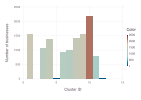

In [82]:
using Gadfly
plot(result.counts, Geom.bar, y=result.counts, Guide.YLabel("Number of businesses"), Guide.XLabel("Cluster ID"), color=result.counts)

In [84]:
companies_in_top_areas[!, :cluster_id] = result.assignments

11965-element Vector{Int64}:
 10
  9
  8
  4
 10
  7
 10
  7
  7
  7
 10
 10
 10
  ⋮
 10
  8
  4
 11
  8
 10
  9
 11
  9
 10
 10
  9

In [85]:
plot(companies_in_top_areas, color=:cluster_id, x=:lat, y=:long)

In [86]:
export_data = @from c in companies_in_top_areas begin
                  @select { Name = c.DBA_Name, Zip = c.Source_Zipcode,
                              Group = string("Cluster $(c.cluster_id)"),
                                Latitude = c.lat, Longitude = c.long, City = "San Francisco",
                                   State = "CA" }
                @collect DataFrame
end

,Name,Zip,Group,Latitude,Longitude,City
,String,Int64,String,Float64,Float64,String
1,Zaalouk Market & Deli Grocery,94109,Cluster 10,37.7877,-122.42,San Francisco
2,1-11 Lilac St Apts,94110,Cluster 9,37.7519,-122.418,San Francisco
3,Sunflower Restaurant,94103,Cluster 8,37.7649,-122.422,San Francisco
4,Bay Music & Entertainment Inc,94109,Cluster 4,37.7957,-122.423,San Francisco
5,Impark 0376,94109,Cluster 10,37.7891,-122.417,San Francisco
6,Geologica Inc,94103,Cluster 7,37.7875,-122.403,San Francisco
7,Impark 0315,94109,Cluster 10,37.7894,-122.422,San Francisco
8,Impark 0324,94103,Cluster 7,37.7867,-122.405,San Francisco
9,Impark 0370,94103,Cluster 7,37.7818,-122.405,San Francisco


In [89]:
using DataFrames
CSV.write("businesses.csv", first(export_data, 250))

"businesses.csv"